In [1]:
import plotly.express as px
# ^^^ pyforest auto-imports - don't write above this line
# https://mybinder.org/v2/gh/8080labs/bamboolib_binder_template/master?filepath=bamboolib_demo_titanic.ipynb

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [14]:
np.random.seed(1)

In [3]:
# data = pd.read_csv('https://raw.githubusercontent.com/ranga6897/DataAnalysis/master/RiceFarms/RiceFarms.csv',index_col = 0)
data = pd.read_csv('RiceFarms.csv',index_col = 0)
# data.drop(columns = 'id',inplace = True)

In [4]:
data

,id,size,status,varieties,bimas,seed,urea,phosphate,pesticide,pseed,purea,pphosph,hiredlabor,famlabor,totlabor,wage,goutput,noutput,price,region
1,101001,3.000,owner,mixed,mixed,90,900,80,6000,80.0,75.0,75.0,2875,40,2915,68.49,7980,6800,60.0,wargabinangun
2,101001,2.000,owner,trad,mixed,40,600,0,3000,70.0,75.0,75.0,2110,45,2155,60.09,4083,3500,60.0,wargabinangun
3,101001,1.000,owner,high,mixed,100,700,150,5000,140.0,70.0,70.0,980,95,1075,51.99,2650,2242,65.0,wargabinangun
4,101001,2.000,owner,high,mixed,60,600,100,5000,90.0,70.0,70.0,2081,10,2091,56.98,4500,3750,70.0,wargabinangun
5,101001,3.572,share,high,no,105,400,400,10200,350.0,80.0,80.0,3889,1,3889,152.03,16300,13584,120.0,wargabinangun
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1022,609245,0.200,owner,trad,mixed,7,70,30,0,100.0,80.0,80.0,130,90,220,53.85,710,640,70.0,ciwangi
1023,609245,0.286,owner,trad,mixed,8,85,20,300,70.0,70.0,70.0,90,151,241,57.22,650,600,70.0,ciwangi
1024,609245,0.286,owner,trad,yes,8,70,25,0,90.0,73.0,75.0,170,72,242,59.41,645,600,80.0,ciwangi
1025,609245,0.786,mixed,mixed,yes,22,158,90,0,150.0,90.0,90.0,630,311,941,152.38,3760,3400,120.0,ciwangi


In [27]:
# creating a new column which tells us the crop yield interms of kgs  for 1 hectare cultivated land
# If the region is best suited for crop, then it yields more crop per hectare of land.
data['gross_op_per_hectare'] = data['goutput']/data['size']


# spending_on_raw_materials = (amount spent on seed) + (amount spent on urea) + (amount spent on phospates) + amount spent on pesticides
# spending_on_raw_materials = (seeds used in kg x price of seeds per kg) + (urea used in kg x price of urea per kg) + (phospate used in kg x price of phosphate per kg) + amount spent on pesticides
data['spending_on_raw_materials'] = (data['seed']*data['pseed']) + (data['urea']*data['purea']) + (data['phosphate']*data['pphosph']) + data['pesticide']


data['spending_per_hectare'] = data['spending_on_raw_materials']/data['size']


In [ ]:
for col in data.select_dtypes(exclude='object').columns:
  print(col)
  sns.distplot(data[col])
  plt.show()
  print()
  print()

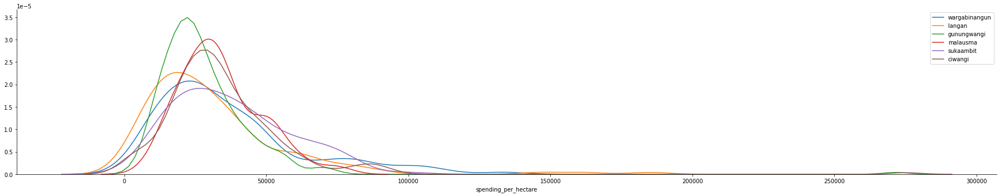

In [ ]:
g = sns.FacetGrid(data, hue='region', aspect=5,height=5)
pl = g.map(sns.distplot, col ,  hist=False, rug=False)
plt.legend()
plt.show()
    

In [ ]:
import plotly.express as px

In [ ]:
data['region'].value_counts()

gunungwangi      222
ciwangi          216
malausma         198
langan           144
sukaambit        132
wargabinangun    114
Name: region, dtype: int64

In [5]:
data['region_en'] = data['region'].replace({'gunungwangi':0,'ciwangi':1,'malausma':2,'langan':3,'sukaambit':4,'wargabinangun':5})

In [6]:
data['size_bn']= pd.cut(data['size'],bins = 10,labels = np.arange(10))
data['size_bn'] = data['size_bn'].astype('int')

In [10]:
np.random.seed(4)

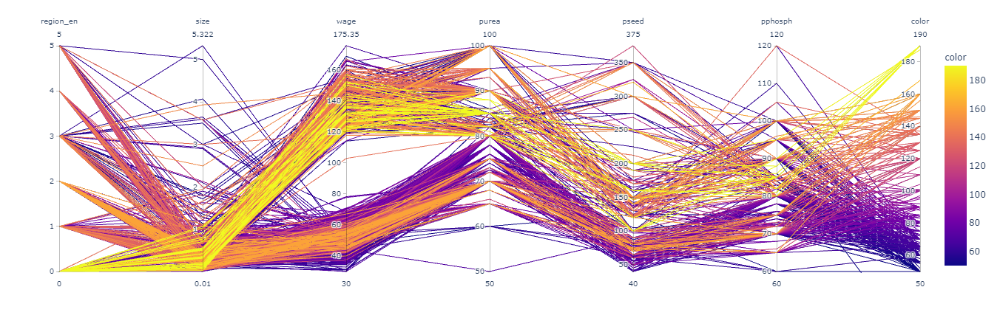

In [7]:
fig = px.parallel_coordinates(data[['region_en','size','wage','purea','pseed','pphosph']], color=data['price'])
fig.show()

0


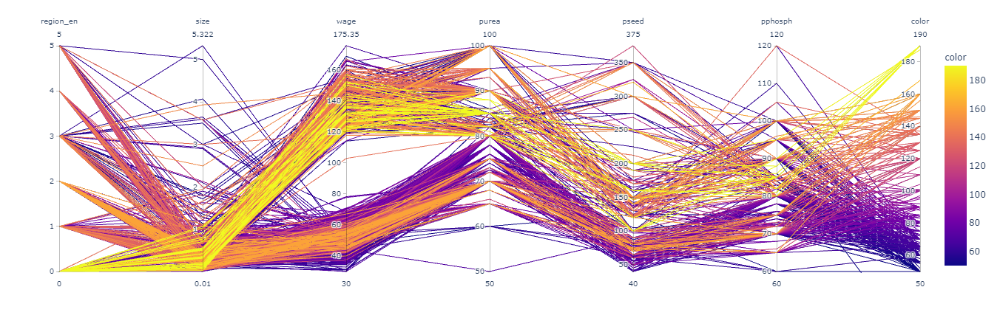

1


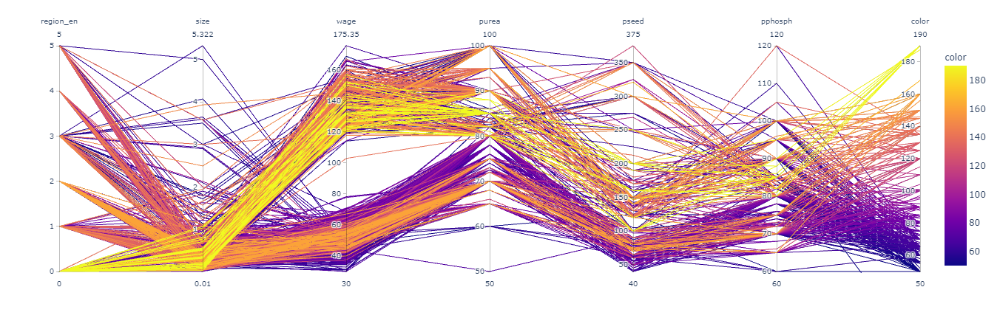

2


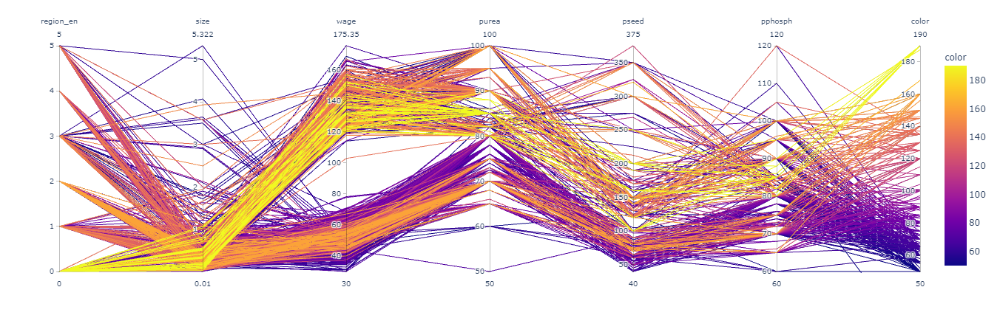

3


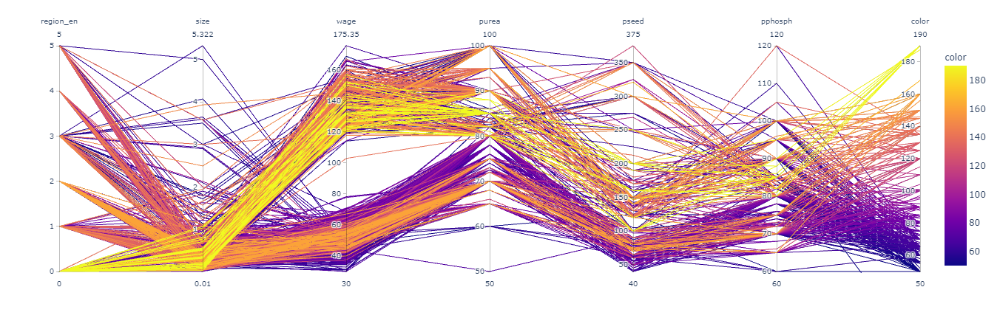

4


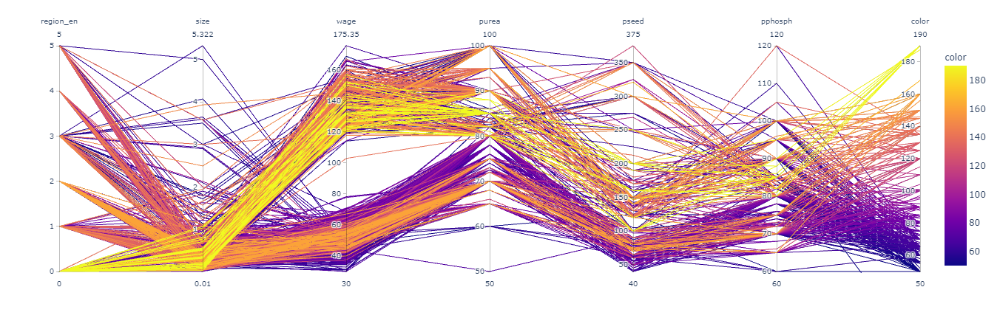

5


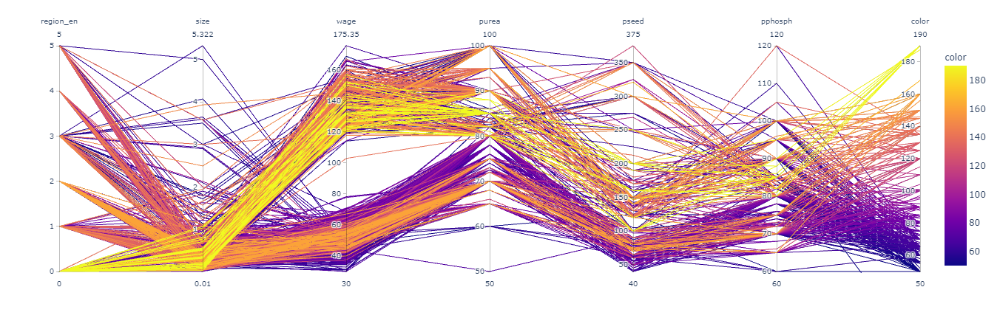

6


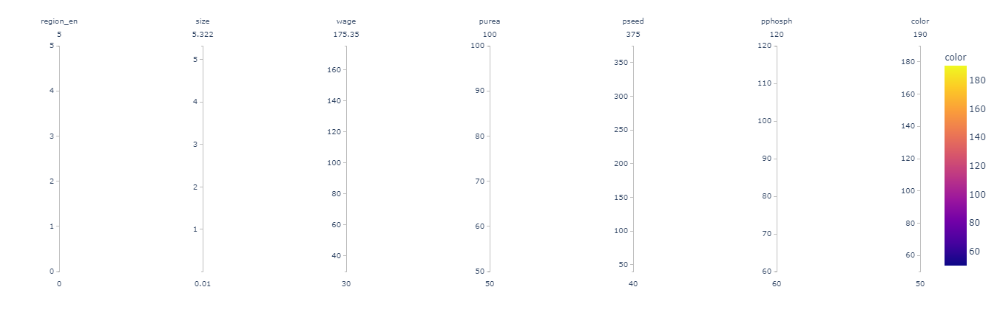

7


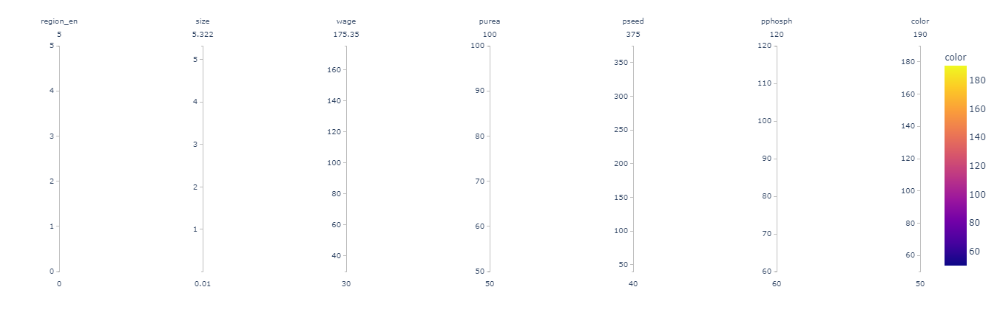

8


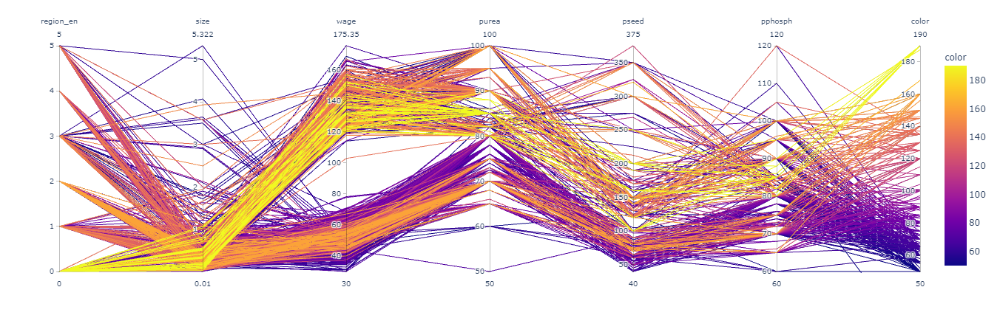

9


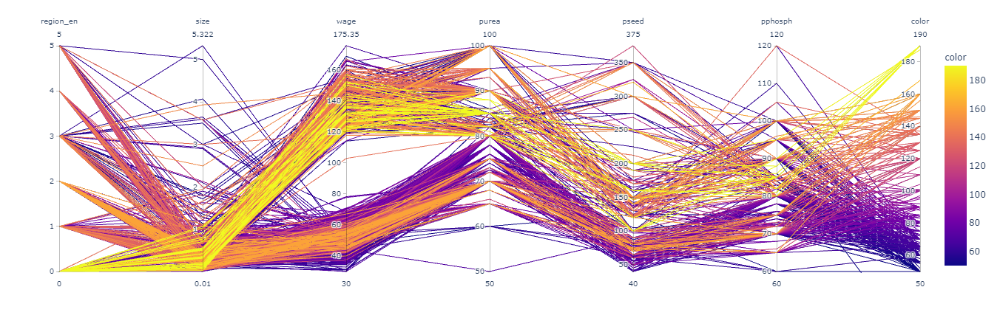

In [33]:
for i in range(10):
    print(i)
    np.random.seed(i)
    fig = px.parallel_coordinates(data[['region_en','size','wage','purea','pseed','pphosph']], color=data['price'])
    fig.show()

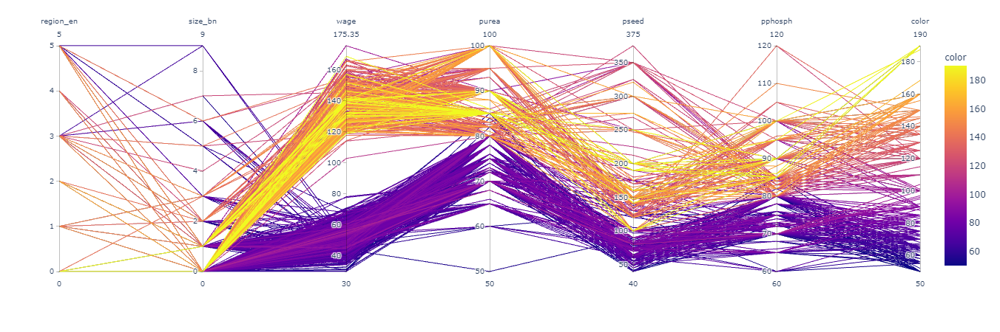

In [8]:
fig = px.parallel_coordinates(data[['region_en','size_bn','wage','purea','pseed','pphosph']], color=data['price'])
fig.show()

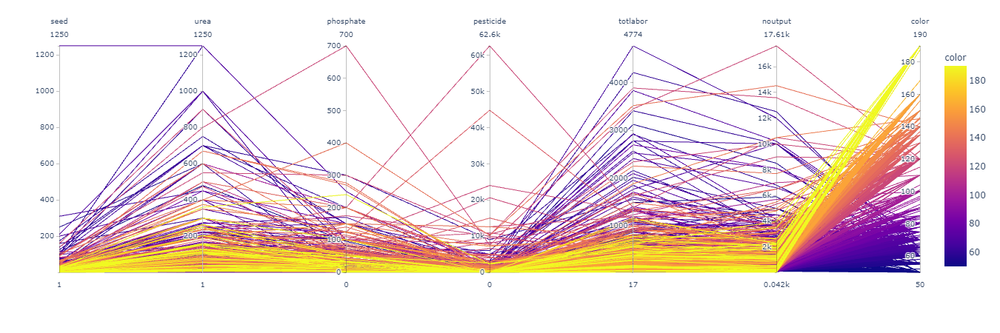

In [9]:
# plot : 3 non-correlated cols  
fig = px.parallel_coordinates(data[['seed','urea','phosphate','pesticide','totlabor','noutput']], color=data['price'])
fig.show()

In [ ]:
data.groupby('region')['size_bn'].value_counts(normalize = True)*100

region         size_bn
ciwangi        0          76.851852
               1          18.055556
               3           3.240741
               2           1.851852
gunungwangi    0          73.423423
               1          25.675676
               3           0.900901
langan         0          59.027778
               1          22.222222
               2           7.638889
               3           3.472222
               5           2.777778
               6           2.083333
               7           1.388889
               4           0.694444
               9           0.694444
malausma       0          93.939394
               1           5.050505
               2           1.010101
sukaambit      0          91.666667
               1           7.575758
               2           0.757576
wargabinangun  0          67.543860
               1          19.298246
               2           5.263158
               6           4.385965
               3           1.754386
     

In [ ]:
from sklearn.tree import DecisionTreeRegressor,plot_tree,export_text

In [ ]:
dt = DecisionTreeRegressor()

dt.fit(data[['region_en','size','wage','purea','pseed','pphosph']],data['price'])

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=None, splitter='best')

In [ ]:
r = export_text(dt, feature_names=['region_en','size','wage','purea','pseed','pphosph'])
print(r)

In [ ]:
dt3 = DecisionTreeRegressor(max_depth= 3)

dt3.fit(data[['region_en','size','wage','purea','pseed','pphosph']],data['price'])

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=3,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=None, splitter='best')

In [ ]:
r = export_text(dt3, feature_names=['region_en','size','wage','purea','pseed','pphosph'])
print(r)

|--- wage <= 90.45
|   |--- region_en <= 1.50
|   |   |--- pseed <= 67.50
|   |   |   |--- value: [67.93]
|   |   |--- pseed >  67.50
|   |   |   |--- value: [73.32]
|   |--- region_en >  1.50
|   |   |--- pseed <= 55.50
|   |   |   |--- value: [55.49]
|   |   |--- pseed >  55.50
|   |   |   |--- value: [65.43]
|--- wage >  90.45
|   |--- region_en <= 0.50
|   |   |--- purea <= 83.50
|   |   |   |--- value: [155.58]
|   |   |--- purea >  83.50
|   |   |   |--- value: [175.45]
|   |--- region_en >  0.50
|   |   |--- region_en <= 2.50
|   |   |   |--- value: [137.80]
|   |   |--- region_en >  2.50
|   |   |   |--- value: [118.78]



In [ ]:
from sklearn.model_selection import cross_val_score

In [ ]:
cv = cross_val_score(dt3, data[['region_en','size','wage','purea','pseed','pphosph']],y = data['price'],
                     cv = 5, n_jobs = -1, scoring = '')